In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd
import scipy.stats as st
import statistics as stats

In [ ]:
data = pd.read_csv("dataset.csv")
col = ['index','one', 'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'ten']

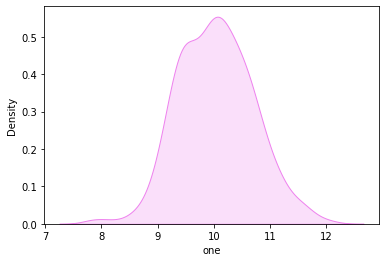

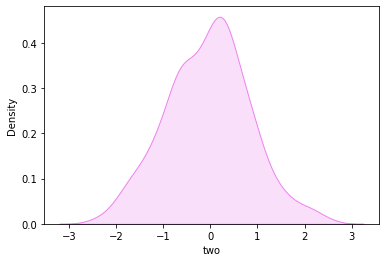

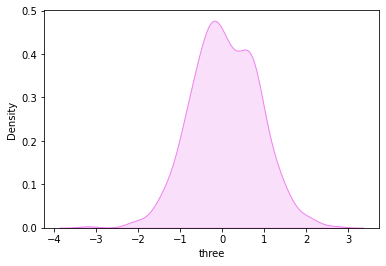

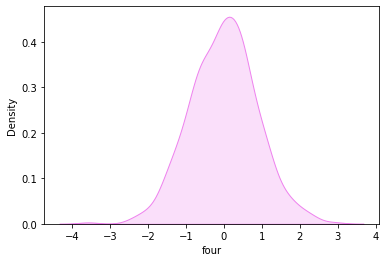

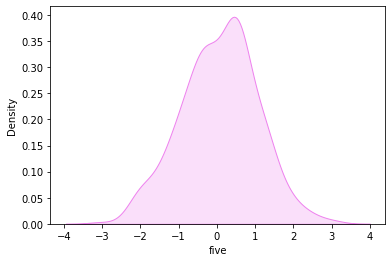

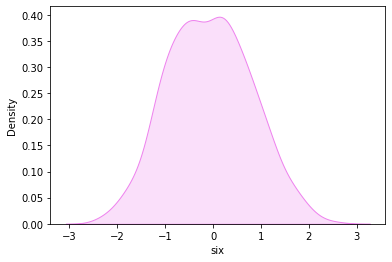

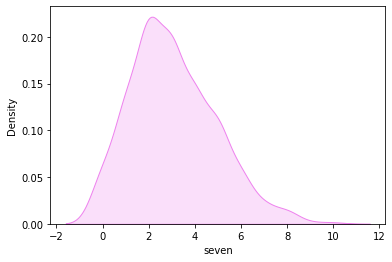

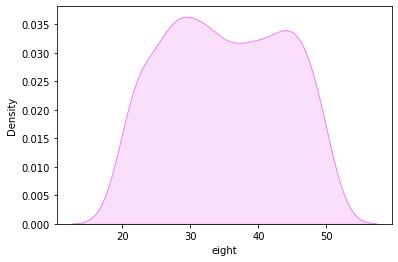

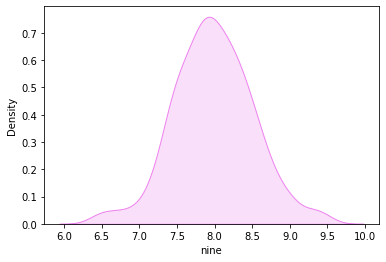

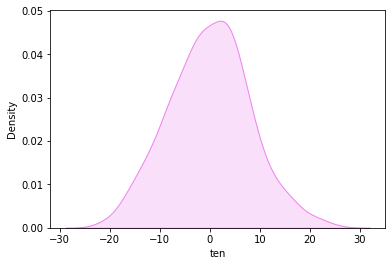

In [ ]:
for i in range(1, 11):
  sb.kdeplot(data[col[i]], fill = True,color='violet')
  plt.show()

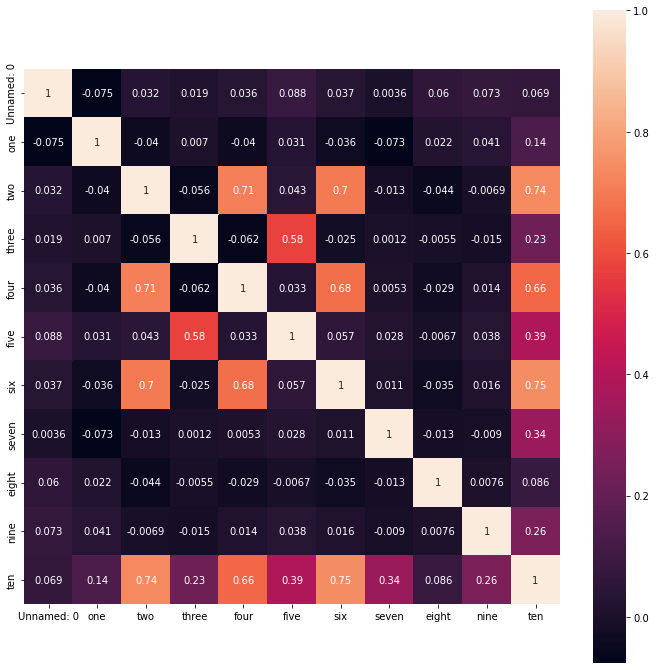

In [ ]:
plt.subplots(figsize = (12, 12))
dataplot = sb.heatmap(data.corr(), annot = True, square = True)

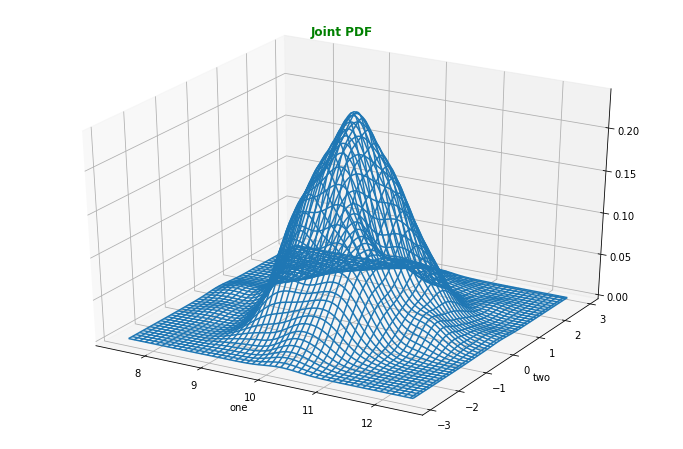

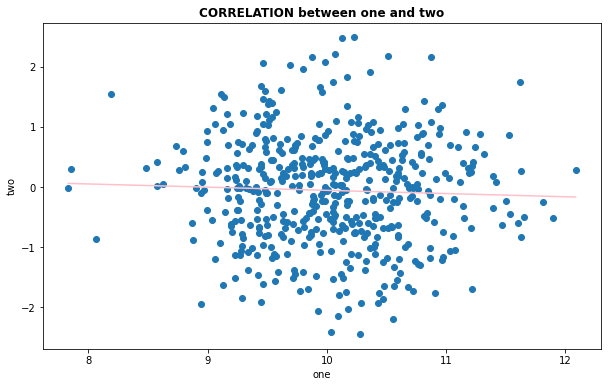

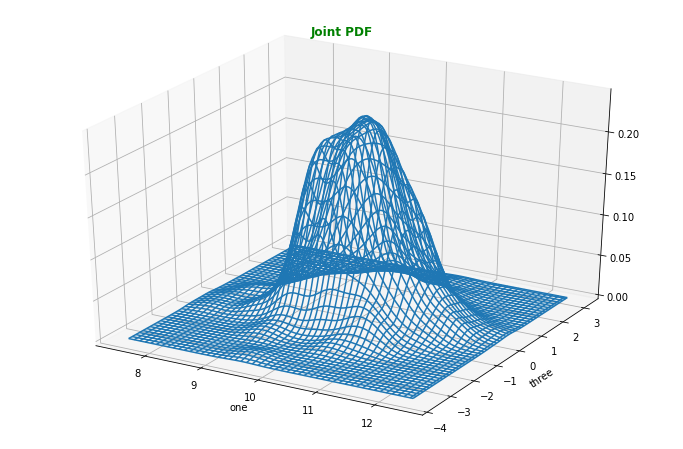

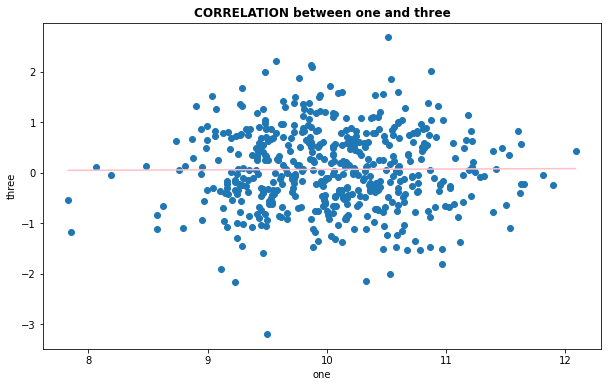

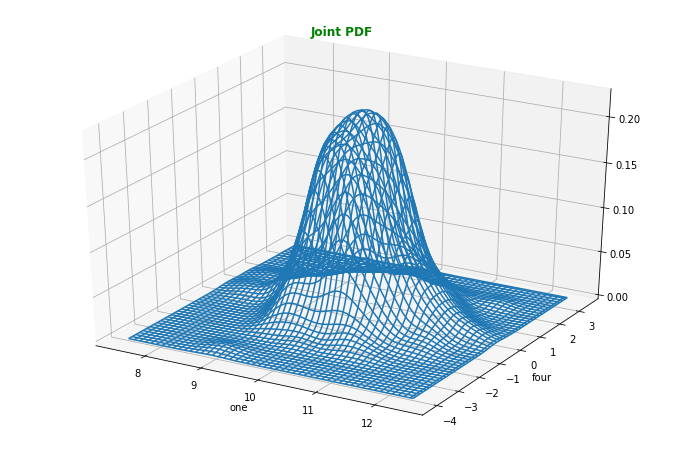

...

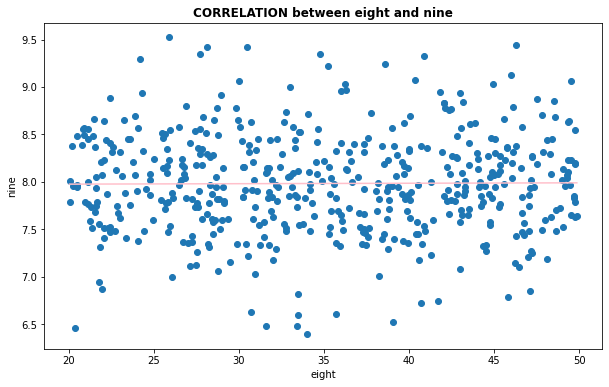

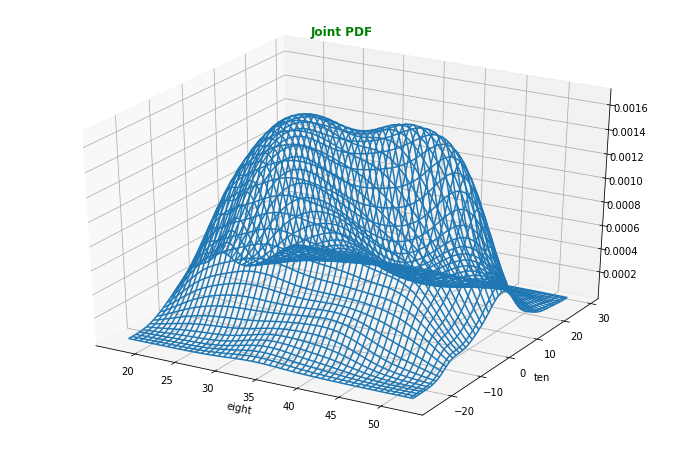

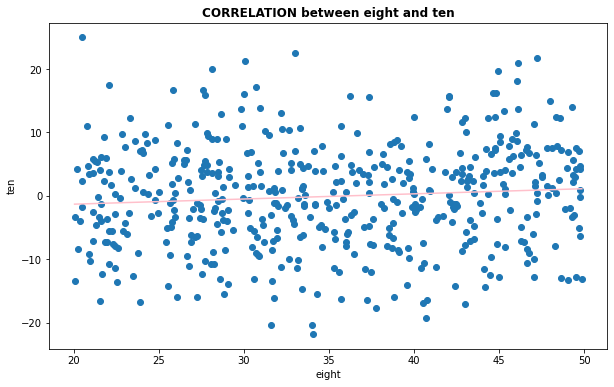

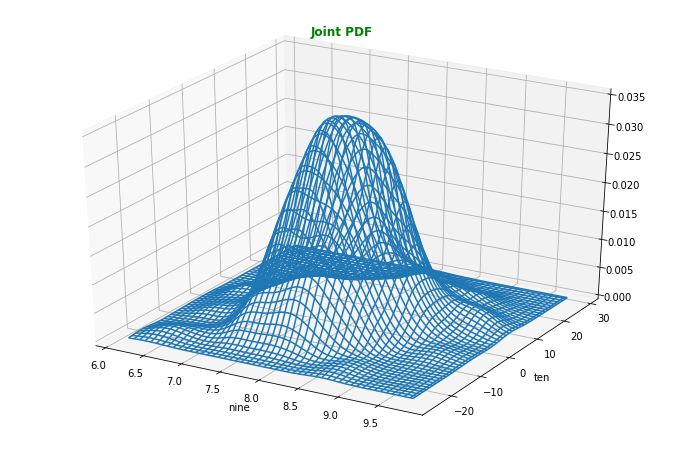

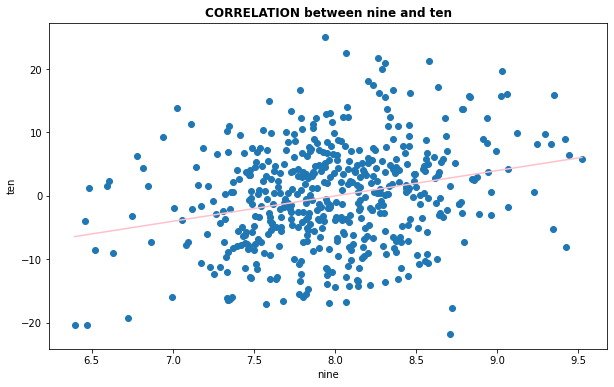

In [ ]:
for i in range(1,11):
  for j in range(i+1,11):
    x = data[col[i]]
    y = data[col[j]]

    dx = (max(x)-min(x))/12
    dy = (max(y)-min(y))/12
    xmin = min(x) - dx
    xmax = max(x) + dx
    ymin = min(y) - dy
    ymax = max(y) + dy

    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    positions = np.vstack([xx.ravel(), yy.ravel()])
    values = np.vstack([x, y])
    kernel = st.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx.shape)

    fig = plt.figure(figsize=(12,8))
    ax = plt.axes(projection='3d')
    w = ax.plot_wireframe(xx, yy, f)
    ax.set_xlabel(col[i])
    ax.set_ylabel(col[j])
    ax.set_title('Joint PDF', loc = 'center', fontweight = "bold", color = "green");
    plt.show()

    fig = plt.figure(figsize=(10, 6))
    plt.title('CORRELATION between {} and {}'.format(col[i], col[j]), fontweight = "bold", color = "black")
    plt.scatter(x,y)
    
    plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color='pink')

    plt.xlabel(col[i])
    plt.ylabel(col[j])

    plt.show()

In [ ]:
deviation = [-1]
mean = [-1]

k = 2.6

for i in range(1, 11):
  deviation.append(stats.stdev(data[col[i]]))
  mean.append(stats.mean(data[col[i]]))

for i in range(1, 11):
  temp = 0
  for j in range(len(data[col[i]])):
    x = data[col[i]][j]
    if ((x - mean[i]) >= k*deviation[i]) or ((mean[i]-x) >= k*deviation[i]):
      temp = temp + 1
  print(temp/len(data[col[i]]))

0.014
0.008
0.014
0.012
0.008
0.002
0.02
0.0
0.02
0.01
